# **Drive Connections and Imports**

Connection to the dataset from GDrive

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!pwd

/content


Imports

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.ensemble import ExtraTreesRegressor
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import cross_val_score

from sklearn.preprocessing import MinMaxScaler

from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM
from tensorflow.keras.layers import Dense, Dropout
from sklearn.preprocessing import StandardScaler
from itertools import cycle
import plotly.express as px

import math
from sklearn.metrics import mean_squared_error, mean_absolute_error, explained_variance_score, r2_score 
from sklearn.metrics import mean_poisson_deviance, mean_gamma_deviance, accuracy_score

# **Reading the Dataset and EDA**

Reading the Datasets

In [ ]:
#Dataset using KNN Imputation
knnImputed_df = pd.read_csv('drive/My Drive/Data Mining Assignment/FinalData_knn-imputed.csv')
knnImputed_df.head()

,State Name,State Code,Date,Sum sites reporting,AQI,Category,OZ_AQI,SO_AQI,NO_AQI,CO_AQI,PM25_AQI,PM10_AQI,Temp,Wind Dir,Wind Speed,Year,Month,Day
0,Alabama,1,2015-03-14,27,42,Good,42.0,1.0,20.0,7.0,30.0,14,60.233334,185.687500,0.908333,2015,3,14
1,Alabama,1,2015-03-28,34,44,Good,44.0,1.0,17.0,7.0,30.0,11,42.504167,264.750000,1.150000,2015,3,28
2,Alabama,1,2015-03-30,29,54,Moderate,54.0,4.0,46.0,9.0,40.0,26,63.945833,225.916666,1.210417,2015,3,30
3,Alabama,1,2015-04-30,37,80,Moderate,80.0,3.0,21.0,9.0,58.0,32,64.064583,237.166666,0.889583,2015,4,30
4,Alabama,1,2015-07-23,35,54,Moderate,38.0,1.0,22.0,9.0,54.0,20,77.462500,184.875000,0.822917,2015,7,23


In [ ]:
#Dataset using Median Imputation
medianImputed_df = pd.read_csv('drive/My Drive/Data Mining Assignment/FinalData_median-imputed.csv')
medianImputed_df.head() 

,State Name,State Code,Date,Sum sites reporting,AQI,Category,OZ_AQI,SO_AQI,NO_AQI,CO_AQI,PM25_AQI,PM10_AQI,Temp,Wind Dir,Wind Speed,Year,Month,Day
0,Alabama,1,2015-03-14,27,42,Good,42.0,1.0,20.0,7.0,30.0,14,60.233334,185.687500,0.908333,2015,3,14
1,Alabama,1,2015-03-28,34,44,Good,44.0,1.0,17.0,7.0,30.0,11,42.504167,264.750000,1.150000,2015,3,28
2,Alabama,1,2015-03-30,29,54,Moderate,54.0,4.0,46.0,9.0,40.0,26,63.945833,225.916666,1.210417,2015,3,30
3,Alabama,1,2015-04-30,37,80,Moderate,80.0,3.0,21.0,9.0,58.0,32,64.064583,237.166666,0.889583,2015,4,30
4,Alabama,1,2015-07-23,35,54,Moderate,38.0,1.0,22.0,9.0,54.0,20,77.462500,184.875000,0.822917,2015,7,23


Removing the unwanted columns

In [ ]:
knnImputed_df.drop(['State Name', 'State Code', 'Date', 'Sum sites reporting', 'Temp', 'Wind Dir', 'Wind Speed', 'Year', 'Month', 'Day'], axis=1, inplace=True)
knnImputed_df = knnImputed_df[['OZ_AQI', 'SO_AQI', 'NO_AQI', 'CO_AQI', 'PM10_AQI', 'PM25_AQI', 'AQI', 'Category']]
knnImputed_df.head()

,OZ_AQI,SO_AQI,NO_AQI,CO_AQI,PM10_AQI,PM25_AQI,AQI,Category
0,42.0,1.0,20.0,7.0,14,30.0,42,Good
1,44.0,1.0,17.0,7.0,11,30.0,44,Good
2,54.0,4.0,46.0,9.0,26,40.0,54,Moderate
3,80.0,3.0,21.0,9.0,32,58.0,80,Moderate
4,38.0,1.0,22.0,9.0,20,54.0,54,Moderate


In [ ]:
medianImputed_df.drop(['State Name', 'State Code', 'Date', 'Sum sites reporting', 'Temp', 'Wind Dir', 'Wind Speed', 'Year', 'Month', 'Day'], axis=1, inplace=True)
medianImputed_df = knnImputed_df[['OZ_AQI', 'SO_AQI', 'NO_AQI', 'CO_AQI', 'PM10_AQI', 'PM25_AQI', 'AQI', 'Category']]
medianImputed_df.head()

,OZ_AQI,SO_AQI,NO_AQI,CO_AQI,PM10_AQI,PM25_AQI,AQI,Category
0,42.0,1.0,20.0,7.0,14,30.0,42,Good
1,44.0,1.0,17.0,7.0,11,30.0,44,Good
2,54.0,4.0,46.0,9.0,26,40.0,54,Moderate
3,80.0,3.0,21.0,9.0,32,58.0,80,Moderate
4,38.0,1.0,22.0,9.0,20,54.0,54,Moderate


Create Temporary table for Category Conversion

In [ ]:
knnImputed_df.Category.unique()

array(['Good', 'Moderate', 'Unhealthy for Sensitive Groups', 'Unhealthy',
       'Very Unhealthy', 'Hazardous'], dtype=object)

Random Plots

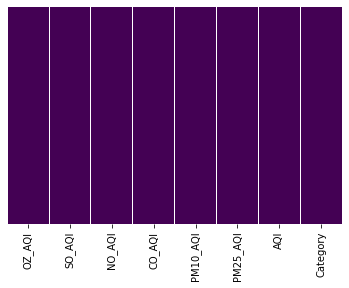

In [ ]:
#check for nulls in knnImputed_df
sns.heatmap(knnImputed_df.isnull(), yticklabels=False,cbar=False,cmap='viridis')

In [ ]:
#Number of nulls in both the dfs
knnImputed_df.isnull().values.ravel().sum()

0

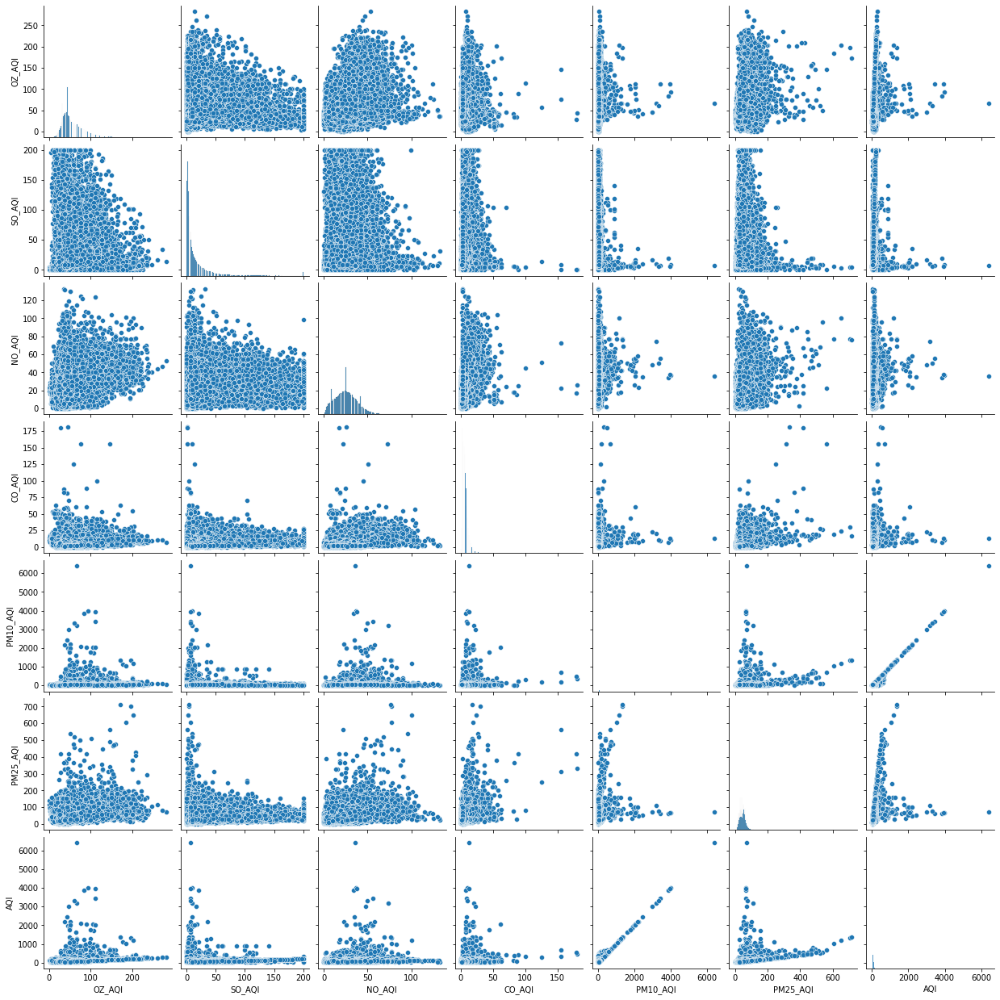

In [ ]:
sns.pairplot(knnImputed_df)

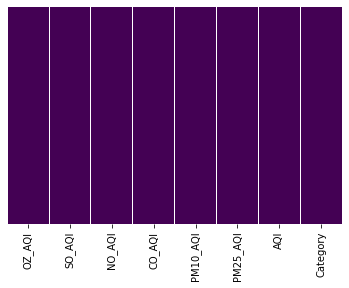

In [ ]:
#check for nulls in medianImputed_df
sns.heatmap(medianImputed_df.isnull(), yticklabels=False,cbar=False,cmap='viridis')

In [ ]:
medianImputed_df.isnull().values.ravel().sum()

0

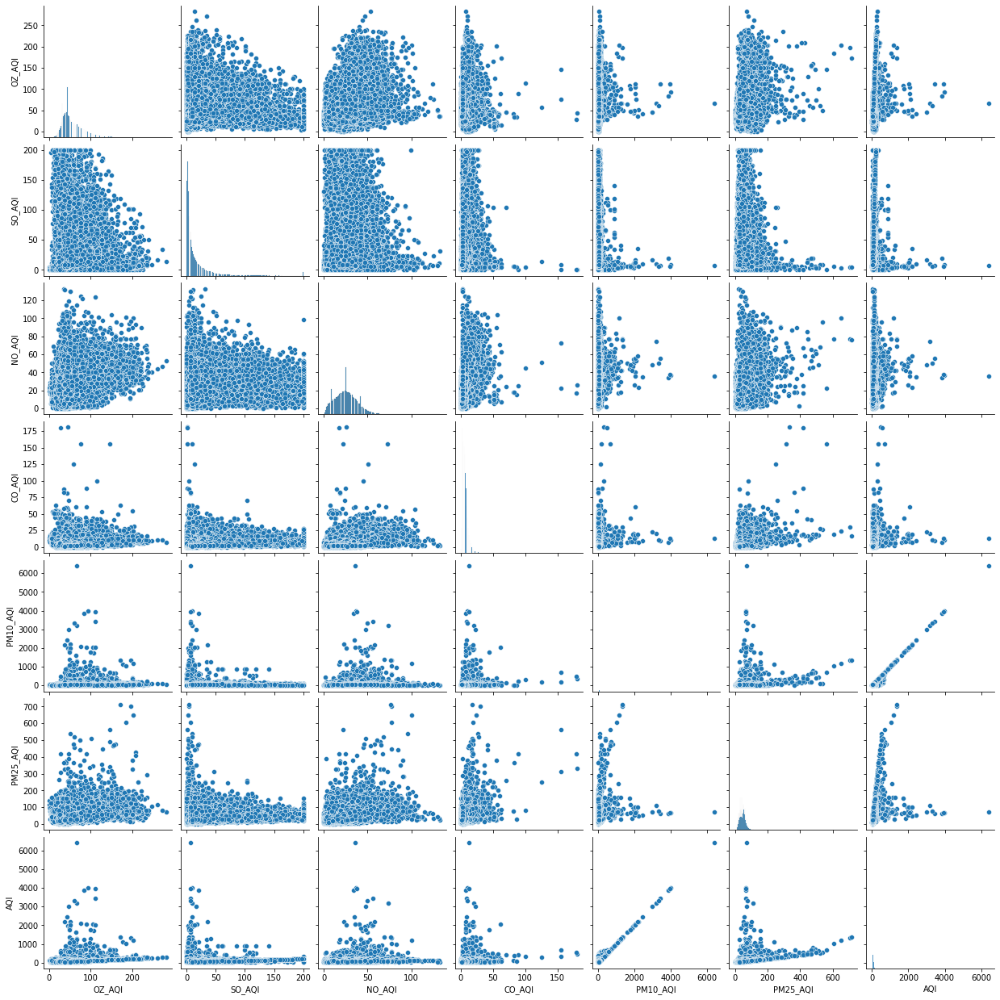

In [ ]:
sns.pairplot(medianImputed_df)

# **Finding Correlation and Plots**

Find Correlation between the different columns

In [ ]:
#For knnImputed_df
corrMat_knn = knnImputed_df.corr()
corrMat_knn

,OZ_AQI,SO_AQI,NO_AQI,CO_AQI,PM10_AQI,PM25_AQI,AQI
OZ_AQI,1.000000,0.009292,0.327576,0.094700,0.170038,0.250600,0.328045
SO_AQI,0.009292,1.000000,0.079831,0.136474,0.029970,0.110827,0.253637
NO_AQI,0.327576,0.079831,1.000000,0.509241,0.159448,0.335964,0.199035
CO_AQI,0.094700,0.136474,0.509241,1.000000,0.144384,0.422868,0.206282
PM10_AQI,0.170038,0.029970,0.159448,0.144384,1.000000,0.249352,0.889422
PM25_AQI,0.250600,0.110827,0.335964,0.422868,0.249352,1.000000,0.411857
AQI,0.328045,0.253637,0.199035,0.206282,0.889422,0.411857,1.000000


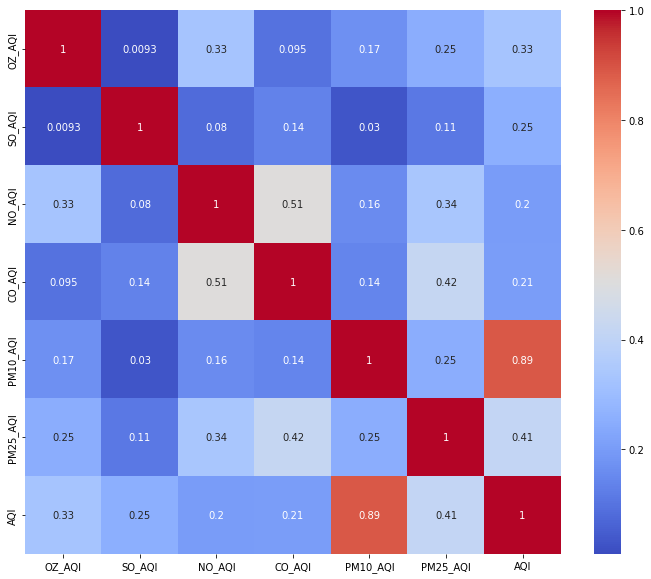

In [ ]:
#Getting correlation of each feature
top_corr_features_knn = corrMat_knn.index
plt.figure(figsize=(12,10))

#Heatmap of Correlation
# sns.heatmap(knnImputed_df[top_corr_features_knn].corr(),annot=True,cmap="RdYlGn")
# plt.figure(figsize=(12,10))
sns.heatmap(knnImputed_df[top_corr_features_knn].corr(),cmap='coolwarm',annot=True);

In [ ]:
corrMat_knn.index

Index(['OZ_AQI', 'SO_AQI', 'NO_AQI', 'CO_AQI', 'PM10_AQI', 'PM25_AQI', 'AQI'], dtype='object')

In [ ]:
#For medianImputed_df
corrMat_median = medianImputed_df.corr()
corrMat_median

,OZ_AQI,SO_AQI,NO_AQI,CO_AQI,PM10_AQI,PM25_AQI,AQI
OZ_AQI,1.000000,0.009292,0.327576,0.094700,0.170038,0.250600,0.328045
SO_AQI,0.009292,1.000000,0.079831,0.136474,0.029970,0.110827,0.253637
NO_AQI,0.327576,0.079831,1.000000,0.509241,0.159448,0.335964,0.199035
CO_AQI,0.094700,0.136474,0.509241,1.000000,0.144384,0.422868,0.206282
PM10_AQI,0.170038,0.029970,0.159448,0.144384,1.000000,0.249352,0.889422
PM25_AQI,0.250600,0.110827,0.335964,0.422868,0.249352,1.000000,0.411857
AQI,0.328045,0.253637,0.199035,0.206282,0.889422,0.411857,1.000000


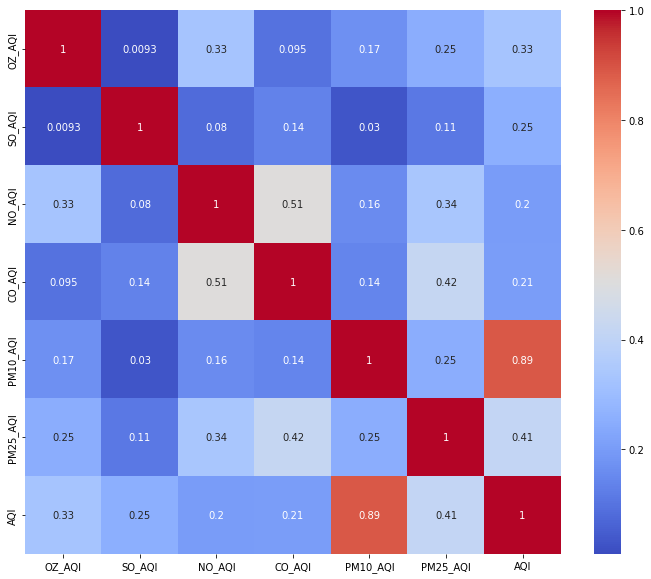

In [ ]:
#Getting correlation of each feature
top_corr_features_median = corrMat_median.index
# plt.figure(figsize=(20,20))

# #Heatmap of Correlation
# sns.heatmap(medianImputed_df[top_corr_features_median].corr(),annot=True,cmap="RdYlGn")
plt.figure(figsize=(12,10))

#Heatmap of Correlation
# sns.heatmap(knnImputed_df[top_corr_features_knn].corr(),annot=True,cmap="RdYlGn")
# plt.figure(figsize=(12,10))
sns.heatmap(medianImputed_df[top_corr_features_median].corr(),cmap='coolwarm',annot=True);

In [ ]:
corrMat_median.index

Index(['OZ_AQI', 'SO_AQI', 'NO_AQI', 'CO_AQI', 'PM10_AQI', 'PM25_AQI', 'AQI'], dtype='object')

# **Feature Importance**

Calculating the feature importance

In [ ]:
#independdent features in knn
X_knn = knnImputed_df.iloc[:,:-2]
#dependent features in knn
Y_knn = knnImputed_df.iloc[:,-2]

In [ ]:
#independdent features in median
X_median = medianImputed_df.iloc[:,:-2]
#dependent features in median
Y_median = medianImputed_df.iloc[:,-2]

In [ ]:
X_knn.head()

,OZ_AQI,SO_AQI,NO_AQI,CO_AQI,PM10_AQI,PM25_AQI
0,42.0,1.0,20.0,7.0,14,30.0
1,44.0,1.0,17.0,7.0,11,30.0
2,54.0,4.0,46.0,9.0,26,40.0
3,80.0,3.0,21.0,9.0,32,58.0
4,38.0,1.0,22.0,9.0,20,54.0


In [ ]:
X_median.head()

,OZ_AQI,SO_AQI,NO_AQI,CO_AQI,PM10_AQI,PM25_AQI
0,42.0,1.0,20.0,7.0,14,30.0
1,44.0,1.0,17.0,7.0,11,30.0
2,54.0,4.0,46.0,9.0,26,40.0
3,80.0,3.0,21.0,9.0,32,58.0
4,38.0,1.0,22.0,9.0,20,54.0


In [ ]:
#Y_knn.Category.replace(['Good', 'Moderate', 'Unhealthy for Sensitive Groups', 'Unhealthy', 'Very Unhealthy', 'Hazardous'], [0, 1, 2, 3, 4, 5], inplace=True)
Y_knn.head()

0    42
1    44
2    54
3    80
4    54
Name: AQI, dtype: int64

In [ ]:
#Y_median.Category.replace(['Good', 'Moderate', 'Unhealthy for Sensitive Groups', 'Unhealthy', 'Very Unhealthy', 'Hazardous'], [0, 1, 2, 3, 4, 5], inplace=True)
Y_median.head()

0    42
1    44
2    54
3    80
4    54
Name: AQI, dtype: int64

In [ ]:
model_knn = ExtraTreesRegressor()
model_knn.fit(X_knn,Y_knn)

ExtraTreesRegressor()

In [ ]:
model_median = ExtraTreesRegressor()
model_median.fit(X_median,Y_median)

ExtraTreesRegressor()

In [ ]:
print(model_knn.feature_importances_)

[0.09203859 0.07556537 0.00556222 0.00451332 0.74418882 0.07813169]


In [ ]:
print(model_median.feature_importances_)

[0.09285864 0.07520883 0.00603991 0.0045625  0.74212177 0.07920836]


Graph of feature importances for better visualization

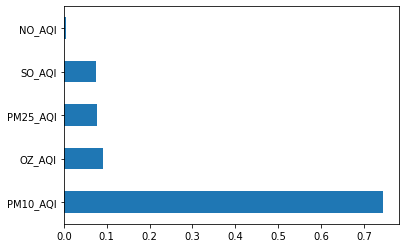

In [ ]:
feat_importances_knn = pd.Series(model_knn.feature_importances_, index=X_knn.columns)
feat_importances_knn.nlargest(5).plot(kind='barh')
plt.show()

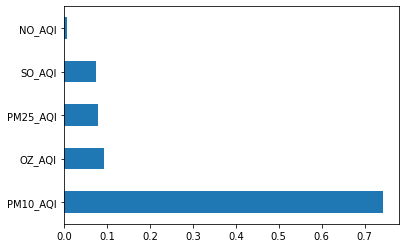

In [ ]:
feat_importances_median = pd.Series(model_median.feature_importances_, index=X_median.columns)
feat_importances_median.nlargest(5).plot(kind='barh')
plt.show()

# **Splitting into training and test datasets**



In [ ]:
#For knn
X_knn_train, X_knn_test, Y_knn_train, Y_knn_test = train_test_split(X_knn, Y_knn, test_size=0.3, random_state=25)

#For median
X_median_train, X_median_test, Y_median_train, Y_median_test = train_test_split(X_median, Y_median, test_size=0.3, random_state=25)

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


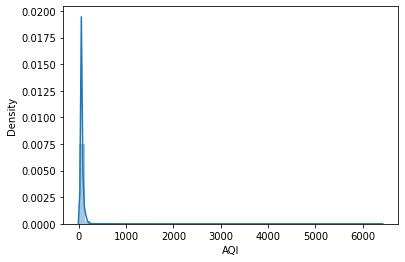

In [ ]:
#Plot for knn
sns.distplot(Y_knn)

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


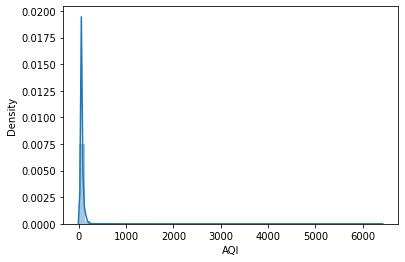

In [ ]:
#Plot for median
sns.distplot(Y_median)

# **Evaluation by Linear Regression**

Linear Regression

In [ ]:
#For knn
regressor_knn=LinearRegression()
regressor_knn.fit(X_knn_train,Y_knn_train)

#For median
regressor_median=LinearRegression()
regressor_median.fit(X_median_train,Y_median_train)

LinearRegression()

In [ ]:
#For knn
regressor_knn.coef_

array([ 0.40225051,  0.43527205, -0.26719231,  0.05014324,  0.91099558,
        0.39936684])

In [ ]:
#For median
regressor_median.coef_

array([ 0.40225051,  0.43527205, -0.26719231,  0.05014324,  0.91099558,
        0.39936684])

In [ ]:
#For knn
regressor_knn.intercept_

0.16957084790919907

In [ ]:
#For median
regressor_median.intercept_

0.16957084790919907

In [ ]:
#For knn
print("Coefficient of determination R^2 <-- on knn train set: {}".format(regressor_knn.score(X_knn_train, Y_knn_train)))

Coefficient of determination R^2 <-- on knn train set: 0.9146140538870315


In [ ]:
#For median
print("Coefficient of determination R^2 <-- on median train set: {}".format(regressor_median.score(X_median_train, Y_median_train)))

Coefficient of determination R^2 <-- on median train set: 0.9146140538870315


In [ ]:
#For knn
print("Coefficient of determination R^2 <-- on knn train set: {}".format(regressor_knn.score(X_knn_test, Y_knn_test)))

Coefficient of determination R^2 <-- on knn train set: 0.7717528246033405


In [ ]:
#For median
print("Coefficient of determination R^2 <-- on median train set: {}".format(regressor_median.score(X_median_test, Y_median_test)))

Coefficient of determination R^2 <-- on median train set: 0.7717528246033405


In [ ]:
#For knn
score_knn=cross_val_score(regressor_knn,X_knn,Y_knn,cv=5)

#For median
score_median=cross_val_score(regressor_median,X_median,Y_median,cv=5)

In [ ]:
#For knn
score_knn.mean()

0.8693244794354351

In [ ]:
#For median
score_median.mean()

0.8693244794354351

Model Evaluation

In [ ]:
#For knn
coeff_df_knn = pd.DataFrame(regressor_knn.coef_,X_knn.columns,columns=['Coefficient'])
coeff_df_knn

,Coefficient
OZ_AQI,0.402251
SO_AQI,0.435272
NO_AQI,-0.267192
CO_AQI,0.050143
PM10_AQI,0.910996
PM25_AQI,0.399367


In [ ]:
#For median
coeff_df_median = pd.DataFrame(regressor_median.coef_,X_median.columns,columns=['Coefficient'])
coeff_df_median

,Coefficient
OZ_AQI,0.402251
SO_AQI,0.435272
NO_AQI,-0.267192
CO_AQI,0.050143
PM10_AQI,0.910996
PM25_AQI,0.399367


In [ ]:
#For knn
prediction_knn=regressor_knn.predict(X_knn_test)
#For median
prediction_median=regressor_median.predict(X_median_test)

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


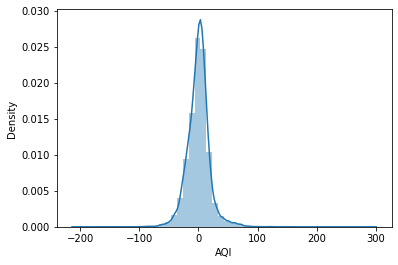

In [ ]:
#For knn
sns.distplot(Y_knn_test-prediction_knn)

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


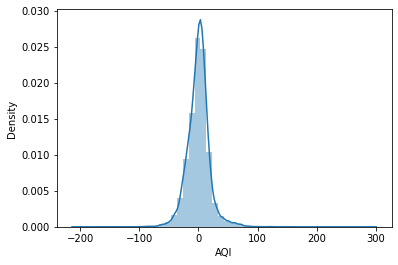

In [ ]:
#For median
sns.distplot(Y_median_test-prediction_median)

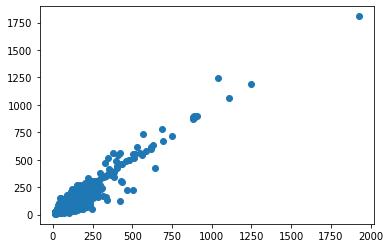

In [ ]:
#For knn
plt.scatter(Y_knn_test,prediction_knn)

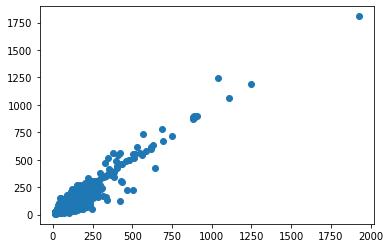

In [ ]:
#For median
plt.scatter(Y_median_test,prediction_median)

Regression Evaluation metrics (loss functions)
1. Mean Absolute Error (MAE)
2. Mean Squared Error (MSE)
3. Root Mean Squared Error (RMSE)

In [ ]:
from sklearn import metrics
from sklearn.metrics import accuracy_score,classification_report,confusion_matrix

In [ ]:
#For knn
print('MAE for knn:', metrics.mean_absolute_error(Y_knn_test, prediction_knn))
print('MSE for knn:', metrics.mean_squared_error(Y_knn_test, prediction_knn))
print('RMSE for knn:', np.sqrt(metrics.mean_squared_error(Y_knn_test, prediction_knn)))

MAE for knn: 13.571450494772954
MSE for knn: 373.0033596531824
RMSE for knn: 19.31329489375602


In [ ]:
#For median
print('MAE for median:', metrics.mean_absolute_error(Y_median_test, prediction_median))
print('MSE for median:', metrics.mean_squared_error(Y_median_test, prediction_median))
print('RMSE for median:', np.sqrt(metrics.mean_squared_error(Y_median_test, prediction_median)))

MAE for median: 13.571450494772954
MSE for median: 373.0033596531824
RMSE for median: 19.31329489375602


In [ ]:
#For knn
print(accuracy_score(Y_knn_test, prediction_knn))
print(classification_report(Y_knn_test, prediction_knn))
print(confusion_matrix(Y_knn_test, prediction_knn))

ValueError: ignored

# **Evaluation by ANN**

In [ ]:
import keras
from keras.models import Sequential
from keras.layers import Dense
from keras.layers import LeakyReLU,PReLU,ELU
from keras.layers import Dropout

In [ ]:
#For knn

NN_model_knn = Sequential()

# The Input Layer :
NN_model_knn.add(Dense(128, kernel_initializer='normal',input_dim = X_knn_train.shape[1], activation='relu'))

# The Hidden Layers :
NN_model_knn.add(Dense(256, kernel_initializer='normal',activation='relu'))
NN_model_knn.add(Dense(256, kernel_initializer='normal',activation='relu'))
NN_model_knn.add(Dense(256, kernel_initializer='normal',activation='relu'))

# The Output Layer :
NN_model_knn.add(Dense(1, kernel_initializer='normal',activation='linear'))

# Compile the network :
NN_model_knn.compile(loss='mean_absolute_error', optimizer='adam', metrics=['mean_absolute_error'])
NN_model_knn.summary()

# Fitting the ANN to the Training set
model_history=NN_model_knn.fit(X_knn_train, Y_knn_train,validation_split=0.33, batch_size = 10, epochs = 100)

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_10 (Dense)            (None, 128)               896       
                                                                 
 dense_11 (Dense)            (None, 256)               33024     
                                                                 
 dense_12 (Dense)            (None, 256)               65792     
                                                                 
 dense_13 (Dense)            (None, 256)               65792     
                                                                 
 dense_14 (Dense)            (None, 1)                 257       
                                                                 
Total params: 165,761
Trainable params: 165,761
Non-trainable params: 0
_________________________________________________________________
Epoch 1/100
4282/4282 [=========================

In [ ]:
#For median

NN_model_median = Sequential()

# The Input Layer :
NN_model_median.add(Dense(128, kernel_initializer='normal',input_dim = X_median_train.shape[1], activation='relu'))

# The Hidden Layers :
NN_model_median.add(Dense(256, kernel_initializer='normal',activation='relu'))
NN_model_median.add(Dense(256, kernel_initializer='normal',activation='relu'))
NN_model_median.add(Dense(256, kernel_initializer='normal',activation='relu'))

# The Output Layer :
NN_model_median.add(Dense(1, kernel_initializer='normal',activation='linear'))

# Compile the network :
NN_model_median.compile(loss='mean_absolute_error', optimizer='adam', metrics=['mean_absolute_error'])
NN_model_median.summary()

# Fitting the ANN to the Training set
model_history=NN_model_knn.fit(X_median_train, Y_median_train,validation_split=0.33, batch_size = 10, nb_epoch = 100)

# **Evaluation by LSTM**

In [ ]:
knnAlabama = knnImputed_df.loc[knnImputed_df['State Name'] == 'Alabama'].copy()
medianAlabama = medianImputed_df.loc[medianImputed_df['State Name'] == 'Alabama'].copy()

In [ ]:
knnAlabama.sort_values(
    by=["Date",
        ],
    ascending=True,
    inplace = True
    )
knnImputed_df.sort_values(
    by=["Date",
        ],
    ascending=True,
    inplace = True
    )
medianAlabama.sort_values(
    by=["Date",
        ],
    ascending=True,
    inplace = True
    )
medianImputed_df.sort_values(
    by=["Date",
        ],
    ascending=True,
    inplace = True
    )

In [ ]:
names = cycle(['AQI','OZ_AQI', 'SO_AQI', 'NO_AQI', 'CO_AQI', 'PM25_AQI','PM10_AQI',])

fig = px.line(knnImputed_df, x=knnImputed_df.Date, y=[knnImputed_df['AQI'],
                                                      knnImputed_df['OZ_AQI'],
                                                      knnImputed_df['SO_AQI'],
                                                      knnImputed_df['NO_AQI'],
                                                      knnImputed_df['CO_AQI'],
                                                      knnImputed_df['PM25_AQI'],
                                                      knnImputed_df['PM10_AQI']],
             labels={'Date': 'Date','value':'Unit value'})
fig.update_layout(title_text='AQI analysis chart', font_size=15, font_color='black',legend_title_text='AQI Parameters')
fig.for_each_trace(lambda t:  t.update(name = next(names)))
fig.update_xaxes(showgrid=False)
fig.update_yaxes(showgrid=False)

fig.show()

In [ ]:
names = cycle(['AQI','OZ_AQI', 'SO_AQI', 'NO_AQI', 'CO_AQI', 'PM25_AQI','PM10_AQI',])

fig = px.line(knnAlabama, x=knnAlabama.Date, y=[knnAlabama['AQI'],
                                                      knnAlabama['OZ_AQI'],
                                                      knnAlabama['SO_AQI'],
                                                      knnAlabama['NO_AQI'],
                                                      knnAlabama['CO_AQI'],
                                                      knnAlabama['PM25_AQI'],
                                                      knnAlabama['PM10_AQI']],
             labels={'Date': 'Date','value':'Unit value'})
fig.update_layout(title_text='AQI analysis chart', font_size=15, font_color='black',legend_title_text='AQI Parameters')
fig.for_each_trace(lambda t:  t.update(name = next(names)))
fig.update_xaxes(showgrid=False)
fig.update_yaxes(showgrid=False)

fig.show()

In [ ]:
knnAlabama['Date'] = pd.to_datetime(knnAlabama['Date'], format='%Y-%m-%d')

# Single Variable KNN

## Modeling

In [ ]:
knnAQIAlabama = knnAlabama[['Date','AQI']]

fig = px.line(knnAQIAlabama, x=knnAQIAlabama.Date, y=knnAQIAlabama.AQI,labels={'date':'Date','AQI':'AQI'})
fig.update_traces(marker_line_width=2, opacity=0.8, marker_line_color='orange')
fig.update_layout(title_text='Whole period of timeframe of AQI for the State of Alabama', plot_bgcolor='white', 
                  font_size=15, font_color='black')
fig.update_xaxes(showgrid=False)
fig.update_yaxes(showgrid=False)
fig.show()


In [ ]:
# deleting date column and normalizing using MinMax Scaler

del knnAQIAlabama['Date']
scaler=MinMaxScaler(feature_range=(0,1))
knnAQIAlabama=scaler.fit_transform(np.array(knnAQIAlabama).reshape(-1,1))
print(knnAQIAlabama.shape)

(2065, 1)


In [ ]:
# we keep the training set as 60% and 40% testing set

training_size=int(len(knnAQIAlabama)*0.60)
test_size=len(knnAQIAlabama)-training_size
train_data,test_data=knnAQIAlabama[0:training_size,:],knnAQIAlabama[training_size:len(knnAQIAlabama),:1]
print("train_data: ", train_data.shape)
print("test_data: ", test_data.shape)

train_data:  (1239, 1)
test_data:  (826, 1)


In [ ]:
# convert an array of values into a dataset matrix
def create_dataset(dataset, time_step=1):
    dataX, dataY = [], []
    for i in range(len(dataset)-time_step-1):
        a = dataset[i:(i+time_step), 0]   ###i=0, 0,1,2,3-----99   100 
        dataX.append(a)
        dataY.append(dataset[i + time_step, 0])
    return np.array(dataX), np.array(dataY)

In [ ]:
time_step = 15
X_train, y_train = create_dataset(train_data, time_step)
X_test, y_test = create_dataset(test_data, time_step)

print("X_train: ", X_train.shape)
print("y_train: ", y_train.shape)
print("X_test: ", X_test.shape)
print("y_test", y_test.shape)

X_train:  (1223, 15)
y_train:  (1223,)
X_test:  (810, 15)
y_test (810,)


In [ ]:
# reshape input to be [samples, time steps, features] which is required for LSTM
X_train =X_train.reshape(X_train.shape[0],X_train.shape[1] , 1)
X_test = X_test.reshape(X_test.shape[0],X_test.shape[1] , 1)

print("X_train: ", X_train.shape)
print("X_test: ", X_test.shape)

X_train:  (1223, 15, 1)
X_test:  (810, 15, 1)


In [ ]:
model=Sequential()

model.add(LSTM(10,input_shape=(None,1),activation="relu"))

model.add(Dense(1))

model.compile(loss="mean_squared_error",optimizer="adam")

history = model.fit(X_train,y_train,validation_data=(X_test,y_test),epochs=200,batch_size=32,verbose=1)


Epoch 1/200
39/39 [==============================] - 2s 15ms/step - loss: 0.0459 - val_loss: 0.0184
Epoch 2/200
39/39 [==============================] - 0s 9ms/step - loss: 0.0184 - val_loss: 0.0063
Epoch 3/200
39/39 [==============================] - 0s 8ms/step - loss: 0.0108 - val_loss: 0.0065
Epoch 4/200
39/39 [==============================] - 0s 8ms/step - loss: 0.0106 - val_loss: 0.0064
Epoch 5/200
39/39 [==============================] - 0s 9ms/step - loss: 0.0105 - val_loss: 0.0064
Epoch 6/200
39/39 [==============================] - 0s 9ms/step - loss: 0.0105 - val_loss: 0.0062
Epoch 7/200
39/39 [==============================] - 0s 9ms/step - loss: 0.0104 - val_loss: 0.0065
Epoch 8/200
39/39 [==============================] - 0s 9ms/step - loss: 0.0104 - val_loss: 0.0063
Epoch 9/200
39/39 [==============================] - 0s 8ms/step - loss: 0.0104 - val_loss: 0.0062
Epoch 10/200
39/39 [==============================] - 0s 8ms/step - loss: 0.0103 - val_loss: 0.0062
Epoch 11

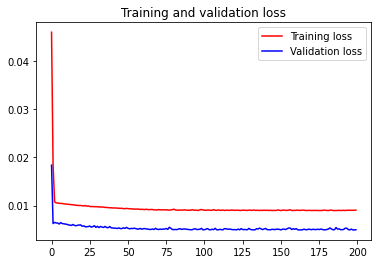

<Figure size 432x288 with 0 Axes>

In [ ]:
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(len(loss))

plt.plot(epochs, loss, 'r', label='Training loss')
plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.legend(loc=0)
plt.figure()

plt.show()

In [ ]:
### Lets Do the prediction and check performance metrics
train_predict=model.predict(X_train)
test_predict=model.predict(X_test)
train_predict.shape, test_predict.shape

# Transform back to original form

train_predict = scaler.inverse_transform(train_predict)
test_predict = scaler.inverse_transform(test_predict)
original_ytrain = scaler.inverse_transform(y_train.reshape(-1,1)) 
original_ytest = scaler.inverse_transform(y_test.reshape(-1,1)) 

AQI_Alabama = knnAlabama[['Date','AQI']]

In [ ]:
# shift train predictions for plotting

look_back=time_step
trainPredictPlot = np.empty_like(knnAQIAlabama)
trainPredictPlot[:, :] = np.nan
trainPredictPlot[look_back:len(train_predict)+look_back, :] = train_predict
print("Train predicted data: ", trainPredictPlot.shape)

Train predicted data:  (2065, 1)


In [ ]:
# shift test predictions for plotting
testPredictPlot = np.empty_like(knnAQIAlabama)
testPredictPlot[:, :] = np.nan
testPredictPlot[len(train_predict)+(look_back*2)+1:len(knnAQIAlabama)-1, :] = test_predict
print("Test predicted data: ", testPredictPlot.shape)

names = cycle(['Original AQI','Train predicted AQI','Test predicted AQI'])


plotdf = pd.DataFrame({'date': AQI_Alabama['Date'],
                       'original_AQI': AQI_Alabama['AQI'],
                      'train_predicted_AQI': trainPredictPlot.reshape(1,-1)[0].tolist(),
                      'test_predicted_AQI': testPredictPlot.reshape(1,-1)[0].tolist()})

fig = px.line(plotdf,x=plotdf['date'], y=[plotdf['original_AQI'],plotdf['train_predicted_AQI'],
                                          plotdf['test_predicted_AQI']],
              labels={'value':'AQI','date': 'Date'})
fig.update_layout(title_text='Comparision between original AQI vs predicted AQI',
                  plot_bgcolor='white', font_size=15, font_color='black', legend_title_text='AQI')
fig.for_each_trace(lambda t:  t.update(name = next(names)))

fig.update_xaxes(showgrid=False)
fig.update_yaxes(showgrid=False)
fig.show()

Test predicted data:  (2065, 1)


## KNN Model Evaluation

### Evaluation metrices RMSE, MSE and MAE

In [ ]:
# Evaluation metrices RMSE and MAE
print("Train data RMSE: ", math.sqrt(mean_squared_error(original_ytrain,train_predict)))
print("Train data MSE: ", mean_squared_error(original_ytrain,train_predict))
print("Train data MAE: ", mean_absolute_error(original_ytrain,train_predict))
print("-------------------------------------------------------------------------------------")
print("Test data RMSE: ", math.sqrt(mean_squared_error(original_ytest,test_predict)))
print("Test data MSE: ", mean_squared_error(original_ytest,test_predict))
print("Test data MAE: ", mean_absolute_error(original_ytest,test_predict))

Train data RMSE:  18.76368509876752
Train data MSE:  352.0758784857103
Train data MAE:  12.107003228350536
-------------------------------------------------------------------------------------
Test data RMSE:  14.000556059979825
Test data MSE:  196.0155699886378
Test data MAE:  10.206322441572025


### Variance Regression Score

In [ ]:
print("Train data explained variance regression score:", 
      explained_variance_score(original_ytrain, train_predict))
print("Test data explained variance regression score:", 
      explained_variance_score(original_ytest, test_predict))

Train data explained variance regression score: 0.18843231238110802
Test data explained variance regression score: 0.23477159396109581


### R square score for regression

In [ ]:
print("Train data R2 score:", r2_score(original_ytrain, train_predict))
print("Test data R2 score:", r2_score(original_ytest, test_predict))

Train data R2 score: 0.18658670812170342
Test data R2 score: 0.22941561097457364


### Regression Loss Mean Gamma deviance regression loss (MGD) and Mean Poisson deviance regression loss (MPD)

In [ ]:
print("Train data MGD: ", mean_gamma_deviance(original_ytrain, train_predict))
print("Test data MGD: ", mean_gamma_deviance(original_ytest, test_predict))
print("----------------------------------------------------------------------")
print("Train data MPD: ", mean_poisson_deviance(original_ytrain, train_predict))
print("Test data MPD: ", mean_poisson_deviance(original_ytest, test_predict))

Train data MGD:  0.06712866861591638
Test data MGD:  0.05097825632852488
----------------------------------------------------------------------
Train data MPD:  4.677617524049503
Test data MPD:  3.077395071081976


# Single variable median

## Modeling

In [ ]:
medianAQIAlabama = medianAlabama[['Date','AQI']]

fig = px.line(medianAQIAlabama, x=medianAQIAlabama.Date, y=medianAQIAlabama.AQI,labels={'date':'Date','AQI':'AQI'})
fig.update_traces(marker_line_width=2, opacity=0.8, marker_line_color='orange')
fig.update_layout(title_text='Whole period of timeframe of AQI for the State of Alabama', plot_bgcolor='white', 
                  font_size=15, font_color='black')
fig.update_xaxes(showgrid=False)
fig.update_yaxes(showgrid=False)
fig.show()


In [ ]:
# deleting date column and normalizing using MinMax Scaler

del medianAQIAlabama['Date']
scaler=MinMaxScaler(feature_range=(0,1))
medianAQIAlabama=scaler.fit_transform(np.array(medianAQIAlabama).reshape(-1,1))
print(medianAQIAlabama.shape)

(2065, 1)


In [ ]:
# we keep the training set as 60% and 40% testing set

training_size=int(len(medianAQIAlabama)*0.60)
test_size=len(medianAQIAlabama)-training_size
train_data,test_data=medianAQIAlabama[0:training_size,:],medianAQIAlabama[training_size:len(medianAQIAlabama),:1]
print("train_data: ", train_data.shape)
print("test_data: ", test_data.shape)

train_data:  (1239, 1)
test_data:  (826, 1)


In [ ]:
# convert an array of values into a dataset matrix
def create_dataset(dataset, time_step=1):
    dataX, dataY = [], []
    for i in range(len(dataset)-time_step-1):
        a = dataset[i:(i+time_step), 0]   ###i=0, 0,1,2,3-----99   100 
        dataX.append(a)
        dataY.append(dataset[i + time_step, 0])
    return np.array(dataX), np.array(dataY)

In [ ]:
time_step = 15
X_train, y_train = create_dataset(train_data, time_step)
X_test, y_test = create_dataset(test_data, time_step)

print("X_train: ", X_train.shape)
print("y_train: ", y_train.shape)
print("X_test: ", X_test.shape)
print("y_test", y_test.shape)

X_train:  (1223, 15)
y_train:  (1223,)
X_test:  (810, 15)
y_test (810,)


In [ ]:
# reshape input to be [samples, time steps, features] which is required for LSTM
X_train =X_train.reshape(X_train.shape[0],X_train.shape[1] , 1)
X_test = X_test.reshape(X_test.shape[0],X_test.shape[1] , 1)

print("X_train: ", X_train.shape)
print("X_test: ", X_test.shape)

X_train:  (1223, 15, 1)
X_test:  (810, 15, 1)


In [ ]:
model=Sequential()

model.add(LSTM(10,input_shape=(None,1),activation="relu"))

model.add(Dense(1))

model.compile(loss="mean_squared_error",optimizer="adam")

history = model.fit(X_train,y_train,validation_data=(X_test,y_test),epochs=200,batch_size=32,verbose=1)


Epoch 1/200
39/39 [==============================] - 2s 14ms/step - loss: 0.0485 - val_loss: 0.0166
Epoch 2/200
39/39 [==============================] - 0s 8ms/step - loss: 0.0169 - val_loss: 0.0063
Epoch 3/200
39/39 [==============================] - 0s 9ms/step - loss: 0.0106 - val_loss: 0.0061
Epoch 4/200
39/39 [==============================] - 0s 8ms/step - loss: 0.0103 - val_loss: 0.0059
Epoch 5/200
39/39 [==============================] - 0s 8ms/step - loss: 0.0102 - val_loss: 0.0060
Epoch 6/200
39/39 [==============================] - 0s 9ms/step - loss: 0.0101 - val_loss: 0.0057
Epoch 7/200
39/39 [==============================] - 0s 8ms/step - loss: 0.0099 - val_loss: 0.0056
Epoch 8/200
39/39 [==============================] - 0s 8ms/step - loss: 0.0099 - val_loss: 0.0057
Epoch 9/200
39/39 [==============================] - 0s 8ms/step - loss: 0.0097 - val_loss: 0.0054
Epoch 10/200
39/39 [==============================] - 0s 9ms/step - loss: 0.0096 - val_loss: 0.0054
Epoch 11

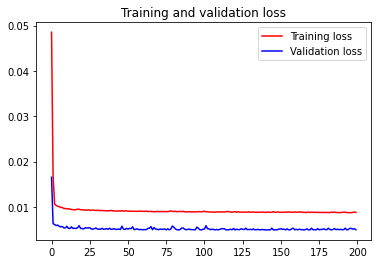

<Figure size 432x288 with 0 Axes>

In [ ]:
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(len(loss))

plt.plot(epochs, loss, 'r', label='Training loss')
plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.legend(loc=0)
plt.figure()

plt.show()

In [ ]:
### Lets Do the prediction and check performance metrics
train_predict=model.predict(X_train)
test_predict=model.predict(X_test)
train_predict.shape, test_predict.shape

# Transform back to original form

train_predict = scaler.inverse_transform(train_predict)
test_predict = scaler.inverse_transform(test_predict)
original_ytrain = scaler.inverse_transform(y_train.reshape(-1,1)) 
original_ytest = scaler.inverse_transform(y_test.reshape(-1,1)) 

AQI_Alabama = medianAlabama[['Date','AQI']]

In [ ]:
# shift train predictions for plotting

look_back=time_step
trainPredictPlot = np.empty_like(medianAQIAlabama)
trainPredictPlot[:, :] = np.nan
trainPredictPlot[look_back:len(train_predict)+look_back, :] = train_predict
print("Train predicted data: ", trainPredictPlot.shape)

Train predicted data:  (2065, 1)


In [ ]:
# shift test predictions for plotting
testPredictPlot = np.empty_like(medianAQIAlabama)
testPredictPlot[:, :] = np.nan
testPredictPlot[len(train_predict)+(look_back*2)+1:len(medianAQIAlabama)-1, :] = test_predict
print("Test predicted data: ", testPredictPlot.shape)

names = cycle(['Original AQI','Train predicted AQI','Test predicted AQI'])


plotdf = pd.DataFrame({'date': AQI_Alabama['Date'],
                       'original_AQI': AQI_Alabama['AQI'],
                      'train_predicted_AQI': trainPredictPlot.reshape(1,-1)[0].tolist(),
                      'test_predicted_AQI': testPredictPlot.reshape(1,-1)[0].tolist()})

fig = px.line(plotdf,x=plotdf['date'], y=[plotdf['original_AQI'],plotdf['train_predicted_AQI'],
                                          plotdf['test_predicted_AQI']],
              labels={'value':'AQI','date': 'Date'})
fig.update_layout(title_text='Comparision between original AQI vs predicted AQI',
                  plot_bgcolor='white', font_size=15, font_color='black', legend_title_text='AQI')
fig.for_each_trace(lambda t:  t.update(name = next(names)))

fig.update_xaxes(showgrid=False)
fig.update_yaxes(showgrid=False)
fig.show()

Test predicted data:  (2065, 1)


## Median Model Evaluation

### Evaluation metrices RMSE, MSE and MAE

In [ ]:
# Evaluation metrices RMSE and MAE
print("Train data RMSE: ", math.sqrt(mean_squared_error(original_ytrain,train_predict)))
print("Train data MSE: ", mean_squared_error(original_ytrain,train_predict))
print("Train data MAE: ", mean_absolute_error(original_ytrain,train_predict))
print("-------------------------------------------------------------------------------------")
print("Test data RMSE: ", math.sqrt(mean_squared_error(original_ytest,test_predict)))
print("Test data MSE: ", mean_squared_error(original_ytest,test_predict))
print("Test data MAE: ", mean_absolute_error(original_ytest,test_predict))

Train data RMSE:  18.50433060383214
Train data MSE:  342.41025109591874
Train data MAE:  11.901354589329717
-------------------------------------------------------------------------------------
Test data RMSE:  13.95249427999457
Test data MSE:  194.6720966332812
Test data MAE:  10.16742370982229


### Variance Regression Score

In [ ]:
print("Train data explained variance regression score:", 
      explained_variance_score(original_ytrain, train_predict))
print("Test data explained variance regression score:", 
      explained_variance_score(original_ytest, test_predict))

Train data explained variance regression score: 0.21230651179139648
Test data explained variance regression score: 0.23598456181547378


### R square score for regression

In [ ]:
print("Train data R2 score:", r2_score(original_ytrain, train_predict))
print("Test data R2 score:", r2_score(original_ytest, test_predict))

Train data R2 score: 0.20891754722097577
Test data R2 score: 0.23469712812532562


### Regression Loss Mean Gamma deviance regression loss (MGD) and Mean Poisson deviance regression loss (MPD)

In [ ]:
print("Train data MGD: ", mean_gamma_deviance(original_ytrain, train_predict))
print("Test data MGD: ", mean_gamma_deviance(original_ytest, test_predict))
print("----------------------------------------------------------------------")
print("Train data MPD: ", mean_poisson_deviance(original_ytrain, train_predict))
print("Test data MPD: ", mean_poisson_deviance(original_ytest, test_predict))

Train data MGD:  0.06568117834671011
Test data MGD:  0.05058827646192789
----------------------------------------------------------------------
Train data MPD:  4.558857178917412
Test data MPD:  3.0534902020074597


# Multivariate

In [ ]:
#Separate dates for future plotting
train_dates = pd.to_datetime(knnAlabama['Date'])
# print(train_dates.tail(15)) #Check last few dates. 

In [ ]:
cols = knnAlabama[['AQI','Category',
                                        'OZ_AQI', 'SO_AQI', 'NO_AQI',
                                        'CO_AQI', 'PM25_AQI', 'PM10_AQI',
                                        'Temp','Wind Speed','State Code']].copy()

In [ ]:
Category = cols[['Category']].copy()
cols.drop(['Category','State Code'], axis=1, inplace=True)
cols

,AQI,OZ_AQI,SO_AQI,NO_AQI,CO_AQI,PM25_AQI,PM10_AQI,Temp,Wind Speed
204,66,29.0,4.0,23.0,6.0,56.0,14,42.925000,0.558334
256,57,20.0,0.0,25.0,6.0,42.0,11,46.925000,0.929167
205,44,23.0,0.0,13.0,5.0,39.0,6,60.133333,1.631250
257,28,26.0,10.0,10.0,7.0,13.0,13,52.662500,2.812500
258,53,28.0,1.0,28.0,6.0,56.0,11,38.085417,22.291667
...,...,...,...,...,...,...,...,...,...
45618,64,36.0,3.0,30.0,13.0,64.0,19,45.761111,0.585417
45619,57,29.0,1.0,26.0,7.0,57.0,25,50.822222,0.714584
45606,58,33.0,1.0,30.0,9.0,58.0,25,52.184722,0.587500
45607,57,37.0,1.0,17.0,6.0,55.0,18,60.650000,0.606250


In [ ]:
df_for_training = cols.values.astype(float)

In [ ]:
scaler = StandardScaler()
scaler = scaler.fit(df_for_training)
df_for_training_scaled = scaler.transform(df_for_training)

In [ ]:
trainX = []
trainY = []

n_future = 1   # Number of days we want to look into the future based on the past days.
n_past = 14

In [ ]:
training_size=int(len(df_for_training_scaled)*0.70)
test_size=len(df_for_training_scaled)-training_size
train_data,test_data=df_for_training_scaled[0:training_size,:],df_for_training_scaled[training_size:len(df_for_training_scaled),:]
print("train_data: ", train_data.shape)
print("test_data: ", test_data.shape)

train_data:  (1445, 9)
test_data:  (620, 9)


In [ ]:
for i in range(n_past, len(df_for_training_scaled) - n_future +1):
    trainX.append(df_for_training_scaled[i - n_past:i, 0:df_for_training.shape[1]])
    trainY.append(df_for_training_scaled[i + n_future - 1:i + n_future, 0])

trainX, trainY = np.array(trainX), np.array(trainY)

print('trainX shape == {}.'.format(trainX.shape))
print('trainY shape == {}.'.format(trainY.shape))


trainX shape == (2051, 14, 9).
trainY shape == (2051, 1).


In [ ]:

model = Sequential()
model.add(LSTM(64, activation='relu', input_shape=(trainX.shape[1], trainX.shape[2]), return_sequences=True))
model.add(LSTM(32, activation='relu', return_sequences=False))
model.add(Dropout(0.2))
model.add(Dense(trainY.shape[1]))

model.compile(optimizer='adam', loss='mse')
model.summary()


Model: "sequential_10"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_11 (LSTM)              (None, 14, 64)            18944     
                                                                 
 lstm_12 (LSTM)              (None, 32)                12416     
                                                                 
 dropout_1 (Dropout)         (None, 32)                0         
                                                                 
 dense_10 (Dense)            (None, 1)                 33        
                                                                 
Total params: 31,393
Trainable params: 31,393
Non-trainable params: 0
_________________________________________________________________


Epoch 1/10
116/116 [==============================] - 3s 27ms/step - loss: 0.7439 - val_loss: 0.3594
Epoch 2/10
116/116 [==============================] - 3s 28ms/step - loss: 0.7295 - val_loss: 0.3943
Epoch 3/10
116/116 [==============================] - 3s 24ms/step - loss: 0.7204 - val_loss: 0.3955
Epoch 4/10
116/116 [==============================] - 3s 24ms/step - loss: 0.7183 - val_loss: 0.3673
Epoch 5/10
116/116 [==============================] - 3s 25ms/step - loss: 0.6930 - val_loss: 0.4658
Epoch 6/10
116/116 [==============================] - 3s 25ms/step - loss: 0.7062 - val_loss: 0.3658
Epoch 7/10
116/116 [==============================] - 2s 19ms/step - loss: 0.6941 - val_loss: 0.3823
Epoch 8/10
116/116 [==============================] - 2s 14ms/step - loss: 0.6606 - val_loss: 0.3942
Epoch 9/10
116/116 [==============================] - 2s 14ms/step - loss: 0.6709 - val_loss: 0.3909
Epoch 10/10
116/116 [==============================] - 2s 15ms/step - loss: 0.6507 - val_lo

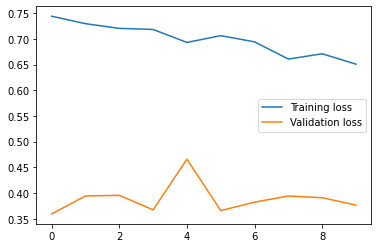

In [ ]:

# fit the model
history = model.fit(trainX, trainY, epochs=10, batch_size=16, validation_split=0.1, verbose=1)
# history = model.fit(trainX, trainY, epochs=50,batch_size=16, validation_split=0.1, verbose=1)

plt.plot(history.history['loss'], label='Training loss')
plt.plot(history.history['val_loss'], label='Validation loss')
plt.legend()


In [ ]:
from pandas.tseries.holiday import USFederalHolidayCalendar
from pandas.tseries.offsets import CustomBusinessDay
us_bd = CustomBusinessDay(calendar=USFederalHolidayCalendar())
#Remember that we can only predict one day in future as our model needs 5 variables
#as inputs for prediction. We only have all 5 variables until the last day in our dataset.
n_past = 16
n_days_for_prediction=15  #let us predict past 15 days

predict_period_dates = pd.date_range(list(train_dates)[-n_past], periods=n_days_for_prediction, freq=us_bd).tolist()
print(predict_period_dates)

#Make prediction
prediction = model.predict(trainX[-n_days_for_prediction:]) #shape = (n, 1) where n is the n_days_for_prediction

#Perform inverse transformation to rescale back to original range
#Since we used 5 variables for transform, the inverse expects same dimensions
#Therefore, let us copy our values 5 times and discard them after inverse transform
prediction_copies = np.repeat(prediction, df_for_training.shape[1], axis=-1)
y_pred_future = scaler.inverse_transform(prediction_copies)[:,0]


[Timestamp('2020-12-16 00:00:00', freq='D'), Timestamp('2020-12-17 00:00:00', freq='D'), Timestamp('2020-12-18 00:00:00', freq='D'), Timestamp('2020-12-19 00:00:00', freq='D'), Timestamp('2020-12-20 00:00:00', freq='D'), Timestamp('2020-12-21 00:00:00', freq='D'), Timestamp('2020-12-22 00:00:00', freq='D'), Timestamp('2020-12-23 00:00:00', freq='D'), Timestamp('2020-12-24 00:00:00', freq='D'), Timestamp('2020-12-25 00:00:00', freq='D'), Timestamp('2020-12-26 00:00:00', freq='D'), Timestamp('2020-12-27 00:00:00', freq='D'), Timestamp('2020-12-28 00:00:00', freq='D'), Timestamp('2020-12-29 00:00:00', freq='D'), Timestamp('2020-12-30 00:00:00', freq='D')]


In [ ]:

# Convert timestamp to date
forecast_dates = []
for time_i in predict_period_dates:
    forecast_dates.append(time_i.date())
    
df_forecast = pd.DataFrame({'Date':np.array(forecast_dates), 'AQI':y_pred_future})
df_forecast['Date']=pd.to_datetime(df_forecast['Date'])


original = knnAlabama[['Date', 'AQI']]
original['Date']=pd.to_datetime(original['Date'])
original = original.loc[original['Date'] >= '2020-5-1']


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



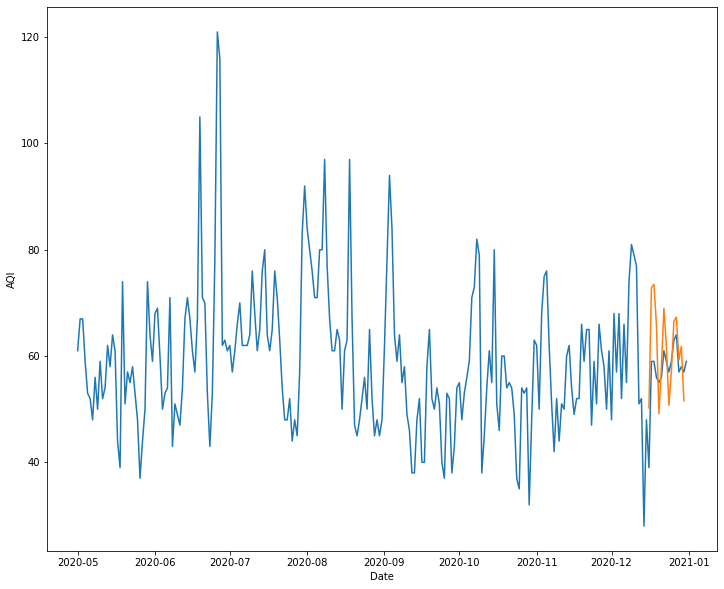

In [ ]:
plt.figure(figsize=(12,10))
sns.lineplot(original['Date'], original['AQI'])
sns.lineplot(df_forecast['Date'], df_forecast['AQI'])

# All cities

In [ ]:
import numpy as np
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM
from tensorflow.keras.layers import Dense, Dropout
import pandas as pd
from matplotlib import pyplot as plt
from sklearn.preprocessing import StandardScaler
import seaborn as sns
#from datetime import datetime

In [ ]:
#Separate dates for future plotting
train_dates = pd.to_datetime(knnImputed_df['Date'])
# print(train_dates.tail(15)) #Check last few dates. 

In [ ]:
cols = knnImputed_df[['AQI','Category',
                                        'OZ_AQI', 'SO_AQI', 'NO_AQI',
                                        'CO_AQI', 'PM25_AQI', 'PM10_AQI',
                                        'Temp','Wind Speed','State Code']].copy()

In [ ]:
Category = cols[['Category']].copy()
cols.drop(['Category'], axis=1, inplace=True)
cols

,AQI,OZ_AQI,SO_AQI,NO_AQI,CO_AQI,PM25_AQI,PM10_AQI,Temp,Wind Speed,State Code
14470,56,46.0,7.0,46.0,3.0,56.0,50,7.717273,3.575595,56
12603,79,38.0,44.0,27.0,15.0,79.0,15,33.360417,4.761458,47
2027,56,32.0,3.0,24.0,5.0,56.0,15,30.157738,8.493351,9
7273,34,34.0,6.0,19.0,5.0,33.0,14,0.770834,4.100000,27
10405,103,31.0,103.0,15.0,3.0,51.0,17,28.208333,9.916666,39
...,...,...,...,...,...,...,...,...,...,...
51843,37,33.0,0.0,26.0,5.0,35.0,4,36.937500,4.506250,23
50038,62,28.0,14.0,25.0,6.0,62.0,17,26.952778,5.459406,18
50980,74,29.0,74.0,14.0,3.0,56.0,14,36.368590,3.782143,21
53127,40,20.0,1.0,9.0,1.0,40.0,18,70.279167,4.608333,28


In [ ]:
df_for_training = cols.values.astype(float)

In [ ]:
scaler = StandardScaler()
scaler = scaler.fit(df_for_training)
df_for_training_scaled = scaler.transform(df_for_training)



In [ ]:
trainX = []
trainY = []

n_future = 1   # Number of days we want to look into the future based on the past days.
n_past = 14

In [ ]:
for i in range(n_past, len(df_for_training_scaled) - n_future +1):
    trainX.append(df_for_training_scaled[i - n_past:i, 0:df_for_training.shape[1]])
    trainY.append(df_for_training_scaled[i + n_future - 1:i + n_future, 0])

trainX, trainY = np.array(trainX), np.array(trainY)

print('trainX shape == {}.'.format(trainX.shape))
print('trainY shape == {}.'.format(trainY.shape))


trainX shape == (91281, 14, 10).
trainY shape == (91281, 1).


In [ ]:

model = Sequential()
model.add(LSTM(64, activation='relu', input_shape=(trainX.shape[1], trainX.shape[2]), return_sequences=True))
model.add(LSTM(32, activation='relu', return_sequences=False))
model.add(Dropout(0.2))
model.add(Dense(trainY.shape[1]))

model.compile(optimizer='adam', loss='mse')
model.summary()


Model: "sequential_8"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_10 (LSTM)              (None, 14, 64)            19200     
                                                                 
 lstm_11 (LSTM)              (None, 32)                12416     
                                                                 
 dropout_2 (Dropout)         (None, 32)                0         
                                                                 
 dense_8 (Dense)             (None, 1)                 33        
                                                                 
Total params: 31,649
Trainable params: 31,649
Non-trainable params: 0
_________________________________________________________________


Epoch 1/5
5135/5135 [==============================] - 68s 13ms/step - loss: nan - val_loss: nan
Epoch 2/5
5135/5135 [==============================] - 65s 13ms/step - loss: nan - val_loss: nan
Epoch 3/5
5135/5135 [==============================] - 63s 12ms/step - loss: nan - val_loss: nan
Epoch 4/5
5135/5135 [==============================] - 64s 12ms/step - loss: nan - val_loss: nan
Epoch 5/5
5135/5135 [==============================] - 65s 13ms/step - loss: nan - val_loss: nan


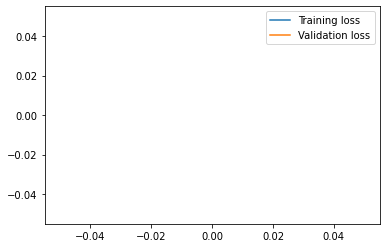

In [ ]:

# fit the model
history = model.fit(trainX, trainY, epochs=5, batch_size=16, validation_split=0.1, verbose=1)

plt.plot(history.history['loss'], label='Training loss')
plt.plot(history.history['val_loss'], label='Validation loss')
plt.legend()


In [ ]:
from pandas.tseries.holiday import USFederalHolidayCalendar
from pandas.tseries.offsets import CustomBusinessDay
us_bd = CustomBusinessDay(calendar=USFederalHolidayCalendar())
#Remember that we can only predict one day in future as our model needs 5 variables
#as inputs for prediction. We only have all 5 variables until the last day in our dataset.
n_past = 16
n_days_for_prediction=15  #let us predict past 15 days

predict_period_dates = pd.date_range(list(train_dates)[-n_past], periods=n_days_for_prediction, freq=us_bd).tolist()
print(predict_period_dates)

#Make prediction
prediction = model.predict(trainX[-n_days_for_prediction:]) #shape = (n, 1) where n is the n_days_for_prediction

#Perform inverse transformation to rescale back to original range
#Since we used 5 variables for transform, the inverse expects same dimensions
#Therefore, let us copy our values 5 times and discard them after inverse transform
prediction_copies = np.repeat(prediction, df_for_training.shape[1], axis=-1)
y_pred_future = scaler.inverse_transform(prediction_copies)[:,0]


[Timestamp('2020-12-31 00:00:00', freq='C'), Timestamp('2021-01-04 00:00:00', freq='C'), Timestamp('2021-01-05 00:00:00', freq='C'), Timestamp('2021-01-06 00:00:00', freq='C'), Timestamp('2021-01-07 00:00:00', freq='C'), Timestamp('2021-01-08 00:00:00', freq='C'), Timestamp('2021-01-11 00:00:00', freq='C'), Timestamp('2021-01-12 00:00:00', freq='C'), Timestamp('2021-01-13 00:00:00', freq='C'), Timestamp('2021-01-14 00:00:00', freq='C'), Timestamp('2021-01-15 00:00:00', freq='C'), Timestamp('2021-01-19 00:00:00', freq='C'), Timestamp('2021-01-20 00:00:00', freq='C'), Timestamp('2021-01-21 00:00:00', freq='C'), Timestamp('2021-01-22 00:00:00', freq='C')]


In [ ]:
from pandas.tseries.holiday import USFederalHolidayCalendar
from pandas.tseries.offsets import CustomBusinessDay
us_bd = CustomBusinessDay(calendar=USFederalHolidayCalendar())
#Remember that we can only predict one day in future as our model needs 5 variables
#as inputs for prediction. We only have all 5 variables until the last day in our dataset.
n_past = 16
n_days_for_prediction=15  #let us predict past 15 days

predict_period_dates = pd.date_range(list(train_dates)[-n_past], periods=n_days_for_prediction).tolist()
print(predict_period_dates)

#Make prediction
prediction = model.predict(trainX[-n_days_for_prediction:]) #shape = (n, 1) where n is the n_days_for_prediction

#Perform inverse transformation to rescale back to original range
#Since we used 5 variables for transform, the inverse expects same dimensions
#Therefore, let us copy our values 5 times and discard them after inverse transform
prediction_copies = np.repeat(prediction, df_for_training.shape[1], axis=-1)
y_pred_future = scaler.inverse_transform(prediction_copies)[:,0]


[Timestamp('2020-12-31 00:00:00', freq='D'), Timestamp('2021-01-01 00:00:00', freq='D'), Timestamp('2021-01-02 00:00:00', freq='D'), Timestamp('2021-01-03 00:00:00', freq='D'), Timestamp('2021-01-04 00:00:00', freq='D'), Timestamp('2021-01-05 00:00:00', freq='D'), Timestamp('2021-01-06 00:00:00', freq='D'), Timestamp('2021-01-07 00:00:00', freq='D'), Timestamp('2021-01-08 00:00:00', freq='D'), Timestamp('2021-01-09 00:00:00', freq='D'), Timestamp('2021-01-10 00:00:00', freq='D'), Timestamp('2021-01-11 00:00:00', freq='D'), Timestamp('2021-01-12 00:00:00', freq='D'), Timestamp('2021-01-13 00:00:00', freq='D'), Timestamp('2021-01-14 00:00:00', freq='D')]


In [ ]:
print(type(us_bd))

<class 'pandas._libs.tslibs.offsets.CustomBusinessDay'>


In [ ]:

# Convert timestamp to date
forecast_dates = []
for time_i in predict_period_dates:
    forecast_dates.append(time_i.date())
    
df_forecast = pd.DataFrame({'Date':np.array(forecast_dates), 'AQI':y_pred_future})
df_forecast['Date']=pd.to_datetime(df_forecast['Date'])


original = knnAlabama[['Date', 'AQI']]
original['Date']=pd.to_datetime(original['Date'])
original = original.loc[original['Date'] >= '2020-5-1']


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



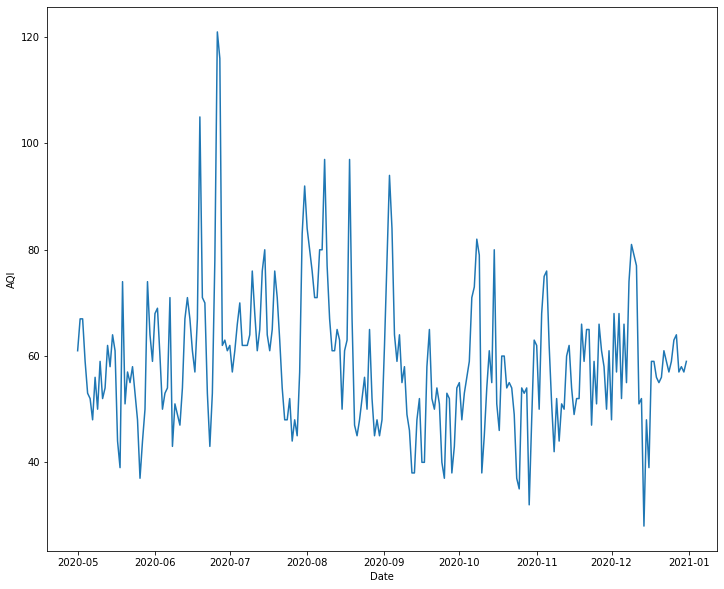

In [ ]:
plt.figure(figsize=(12,10))
sns.lineplot(original['Date'], original['AQI'])
sns.lineplot(df_forecast['Date'], df_forecast['AQI'])

# not working


In [ ]:
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import MinMaxScaler

In [ ]:
def series_to_supervised(data, n_in=1, n_out=1, dropnan=True):
	n_vars = 1 if type(data) is list else data.shape[1]
	df = pd.DataFrame(data)
	cols, names = list(), list()
	# input sequence (t-n, ... t-1)
	for i in range(n_in, 0, -1):
		cols.append(df.shift(i))
		names += [('var%d(t-%d)' % (j+1, i)) for j in range(n_vars)]
	# forecast sequence (t, t+1, ... t+n)
	for i in range(0, n_out):
		cols.append(df.shift(-i))
		if i == 0:
			names += [('var%d(t)' % (j+1)) for j in range(n_vars)]
		else:
			names += [('var%d(t+%d)' % (j+1, i)) for j in range(n_vars)]
	# put it all together
	agg = pd.concat(cols, axis=1)
	agg.columns = names
	# drop rows with NaN values
	if dropnan:
		agg.dropna(inplace=True)
	return agg
 


In [ ]:
knnAlabama.columns

Index(['State Code', 'Date', 'AQI', 'Category', 'OZ_AQI', 'SO_AQI', 'NO_AQI',
       'CO_AQI', 'PM25_AQI', 'PM10_AQI', 'Temp', 'Wind Speed', 'Year', 'Month',
       'Day'],
      dtype='object')

In [ ]:
knnAlabamaDate = knnAlabama[['Date']].copy()

In [ ]:
#for time being
knnAlabama.drop(['State Code','Date'], axis=1, inplace=True)
knnAlabama.head()

,AQI,Category,OZ_AQI,SO_AQI,NO_AQI,CO_AQI,PM25_AQI,PM10_AQI,Temp,Wind Speed,Year,Month,Day
204,66,Moderate,29.0,4.0,23.0,6.0,56.0,14,42.925000,0.558334,2015,1,1
256,57,Moderate,20.0,0.0,25.0,6.0,42.0,11,46.925000,0.929167,2015,1,2
205,44,Good,23.0,0.0,13.0,5.0,39.0,6,60.133333,1.631250,2015,1,3
257,28,Good,26.0,10.0,10.0,7.0,13.0,13,52.662500,2.812500,2015,1,4
258,53,Moderate,28.0,1.0,28.0,6.0,56.0,11,38.085417,22.291667,2015,1,5


In [ ]:
knnAlabama.head()

,AQI,Category,OZ_AQI,SO_AQI,NO_AQI,CO_AQI,PM25_AQI,PM10_AQI,Temp,Wind Speed,Year,Month,Day
204,66,Moderate,29.0,4.0,23.0,6.0,56.0,14,42.925000,0.558334,2015,1,1
256,57,Moderate,20.0,0.0,25.0,6.0,42.0,11,46.925000,0.929167,2015,1,2
205,44,Good,23.0,0.0,13.0,5.0,39.0,6,60.133333,1.631250,2015,1,3
257,28,Good,26.0,10.0,10.0,7.0,13.0,13,52.662500,2.812500,2015,1,4
258,53,Moderate,28.0,1.0,28.0,6.0,56.0,11,38.085417,22.291667,2015,1,5


In [ ]:
# load dataset
values = knnAlabama.values
# integer encode category
encoder = LabelEncoder()
# values[:,5] = encoder.fit_transform(values[:,5])
values[:,1] = encoder.fit_transform(values[:,1])


In [ ]:
print(values[:,1])

[1 1 0 ... 1 1 1]


In [ ]:
# ensure all data is float
values = values.astype('float32')
# normalize features
scaler = MinMaxScaler(feature_range=(0, 1))
scaled = scaler.fit_transform(values)
# frame as supervised learning
reframed = series_to_supervised(scaled, 1, 1)
# drop columns we don't want to predict
reframed.drop(reframed.columns[[14,15,16,17,18,19,20,21,22,23,24,25]], axis=1, inplace=True)
print(reframed.head())

   var1(t-1)  var2(t-1)  var3(t-1)  var4(t-1)  var5(t-1)  var6(t-1)  \
1   0.217172       0.25   0.124138   0.032258   0.316667       0.20   
2   0.171717       0.25   0.062069   0.000000   0.350000       0.20   
3   0.106061       0.00   0.082759   0.000000   0.150000       0.16   
4   0.025253       0.00   0.103448   0.080645   0.100000       0.24   
5   0.151515       0.25   0.117241   0.008065   0.400000       0.20   

   var7(t-1)  var8(t-1)  var9(t-1)  var10(t-1)  var11(t-1)  var12(t-1)  \
1      0.400   0.151899   0.318715    0.022053         0.0         0.0   
2      0.288   0.113924   0.378644    0.038547         0.0         0.0   
3      0.264   0.050633   0.576534    0.069774         0.0         0.0   
4      0.056   0.139241   0.464604    0.122313         0.0         0.0   
5      0.400   0.113924   0.246208    0.988695         0.0         0.0   

   var13(t-1)   var1(t)  
1    0.000000  0.171717  
2    0.033333  0.106061  
3    0.066667  0.025253  
4    0.100000  0.151515 

In [ ]:
print(reframed.shape)

(2064, 14)


In [ ]:
reframed.columns

Index(['var1(t-1)', 'var2(t-1)', 'var3(t-1)', 'var4(t-1)', 'var5(t-1)',
       'var6(t-1)', 'var7(t-1)', 'var8(t-1)', 'var9(t-1)', 'var10(t-1)',
       'var11(t-1)', 'var12(t-1)', 'var13(t-1)', 'var1(t)'],
      dtype='object')

## LSTM divide dataset

In [ ]:
train_date = pd.to_datetime(knnAlabamaDate['Date'])

In [ ]:
train_date

204     2015-01-01
256     2015-01-02
205     2015-01-03
257     2015-01-04
258     2015-01-05
           ...    
45618   2020-12-27
45619   2020-12-28
45606   2020-12-29
45607   2020-12-30
45608   2020-12-31
Name: Date, Length: 2065, dtype: datetime64[ns]

In [ ]:
# split into train and test sets
values = reframed.values
n_train_hours = 365 * 24
train = values[:train_date, :]
test = values[train_date:, :]
# split into input and outputs
train_X, train_y = train[:, :-1], train[:, -1]
test_X, test_y = test[:, :-1], test[:, -1]
# reshape input to be 3D [samples, timesteps, features]
train_X = train_X.reshape((train_X.shape[0], 1, train_X.shape[1]))
test_X = test_X.reshape((test_X.shape[0], 1, test_X.shape[1]))
print(train_X.shape, train_y.shape, test_X.shape, test_y.shape)

TypeError: ignored

In [ ]:
train

array([[0.21717173, 0.25      , 0.12413794, ..., 0.        , 0.        ,
        0.17171717],
       [0.17171717, 0.25      , 0.06206897, ..., 0.        , 0.03333334,
        0.10606061],
       [0.10606061, 0.        , 0.08275862, ..., 0.        , 0.06666668,
        0.02525252],
       ...,
       [0.17171717, 0.25      , 0.12413794, ..., 1.        , 0.90000004,
        0.17676768],
       [0.17676768, 0.25      , 0.15172414, ..., 1.        , 0.93333334,
        0.17171717],
       [0.17171717, 0.25      , 0.17931034, ..., 1.        , 0.96666664,
        0.18181819]], dtype=float32)

In [ ]:
# design network
model = Sequential()
model.add(LSTM(50, input_shape=(train_X.shape[1], train_X.shape[2])))
model.add(Dense(1))
model.compile(loss='mae', optimizer='adam')
# fit network
history = model.fit(train_X, train_y, epochs=50, batch_size=72, validation_data=(test_X, test_y), verbose=2, shuffle=False)


Epoch 1/50
29/29 - 2s - loss: 0.0858 - 2s/epoch - 69ms/step
Epoch 2/50
29/29 - 0s - loss: 0.0718 - 75ms/epoch - 3ms/step
Epoch 3/50
29/29 - 0s - loss: 0.0667 - 92ms/epoch - 3ms/step
Epoch 4/50
29/29 - 0s - loss: 0.0591 - 80ms/epoch - 3ms/step
Epoch 5/50
29/29 - 0s - loss: 0.0566 - 84ms/epoch - 3ms/step
Epoch 6/50
29/29 - 0s - loss: 0.0561 - 86ms/epoch - 3ms/step
Epoch 7/50
29/29 - 0s - loss: 0.0557 - 83ms/epoch - 3ms/step
Epoch 8/50
29/29 - 0s - loss: 0.0554 - 87ms/epoch - 3ms/step
Epoch 9/50
29/29 - 0s - loss: 0.0553 - 84ms/epoch - 3ms/step
Epoch 10/50
29/29 - 0s - loss: 0.0552 - 85ms/epoch - 3ms/step
Epoch 11/50
29/29 - 0s - loss: 0.0551 - 80ms/epoch - 3ms/step
Epoch 12/50
29/29 - 0s - loss: 0.0550 - 85ms/epoch - 3ms/step
Epoch 13/50
29/29 - 0s - loss: 0.0550 - 88ms/epoch - 3ms/step
Epoch 14/50
29/29 - 0s - loss: 0.0548 - 87ms/epoch - 3ms/step
Epoch 15/50
29/29 - 0s - loss: 0.0548 - 92ms/epoch - 3ms/step
Epoch 16/50
29/29 - 0s - loss: 0.0547 - 83ms/epoch - 3ms/step
Epoch 17/50
29/29 

In [ ]:
history_dict = history.history
print(history_dict.keys())

dict_keys(['loss'])


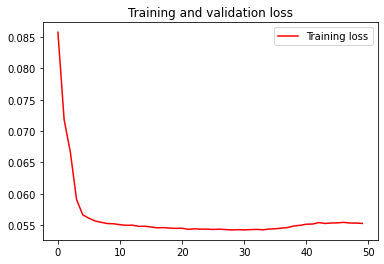

<Figure size 432x288 with 0 Axes>

In [ ]:
loss = history.history['loss']
# val_loss = history.history['acc']

epochs = range(len(loss))

plt.plot(epochs, loss, 'r', label='Training loss')
# plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.legend(loc=0)
plt.figure()


plt.show()

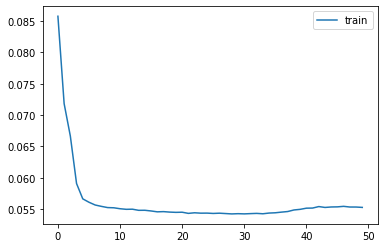

In [ ]:
# plot history
pyplot.plot(history.history['loss'], label='train')
# pyplot.plot(history.history['val_loss'], label='test')
pyplot.legend()
pyplot.show()

In [ ]:
# make a prediction
yhat = model.predict(test_X)
test_X = test_X.reshape((test_X.shape[0], test_X.shape[2]))
# invert scaling for forecast
inv_yhat = concatenate((yhat, test_X[:, 1:]), axis=1)
inv_yhat = scaler.inverse_transform(inv_yhat)
inv_yhat = inv_yhat[:,0]
# invert scaling for actual
test_y = test_y.reshape((len(test_y), 1))
inv_y = concatenate((test_y, test_X[:, 1:]), axis=1)
inv_y = scaler.inverse_transform(inv_y)
inv_y = inv_y[:,0]
# calculate RMSE
rmse = sqrt(mean_squared_error(inv_y, inv_yhat))
print('Test RMSE: %.3f' % rmse)

ValueError: ignored

Epoch 1/50
29/29 - 1s - loss: 0.0944 - 1s/epoch - 39ms/step
Epoch 2/50
29/29 - 1s - loss: 0.0623 - 873ms/epoch - 30ms/step
Epoch 3/50
29/29 - 1s - loss: 0.0588 - 868ms/epoch - 30ms/step
Epoch 4/50
29/29 - 1s - loss: 0.0562 - 846ms/epoch - 29ms/step
Epoch 5/50
29/29 - 1s - loss: 0.0554 - 893ms/epoch - 31ms/step
Epoch 6/50
29/29 - 1s - loss: 0.0551 - 840ms/epoch - 29ms/step
Epoch 7/50
29/29 - 1s - loss: 0.0550 - 842ms/epoch - 29ms/step
Epoch 8/50
29/29 - 1s - loss: 0.0549 - 894ms/epoch - 31ms/step
Epoch 9/50
29/29 - 1s - loss: 0.0548 - 838ms/epoch - 29ms/step
Epoch 10/50
29/29 - 1s - loss: 0.0548 - 761ms/epoch - 26ms/step
Epoch 11/50
29/29 - 0s - loss: 0.0546 - 459ms/epoch - 16ms/step
Epoch 12/50
29/29 - 0s - loss: 0.0547 - 452ms/epoch - 16ms/step
Epoch 13/50
29/29 - 0s - loss: 0.0545 - 445ms/epoch - 15ms/step
Epoch 14/50
29/29 - 0s - loss: 0.0544 - 448ms/epoch - 15ms/step
Epoch 15/50
29/29 - 0s - loss: 0.0544 - 459ms/epoch - 16ms/step
Epoch 16/50
29/29 - 0s - loss: 0.0544 - 470ms/epoch 

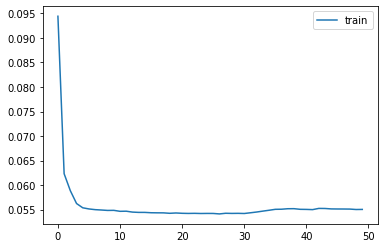

ValueError: ignored

In [ ]:
model = Sequential()
model.add(LSTM(50, input_shape=(train_X.shape[1], train_X.shape[2])))
model.add(Dense(1))
model.compile(loss='mae', optimizer='adam',run_eagerly=True)
# fit network
history = model.fit(train_X, train_y, epochs=50, batch_size=72, validation_data=(test_X, test_y), verbose=2, shuffle=False)
# plot history
pyplot.plot(history.history['loss'], label='train')
# pyplot.plot(history.history['val_loss'], label='test')
pyplot.legend()
pyplot.show()
 
# make a prediction
yhat = model.predict(test_X)
test_X = test_X.reshape((test_X.shape[0], test_X.shape[2]))
# invert scaling for forecast
inv_yhat = concatenate((yhat, test_X[:, 1:]), axis=1)
inv_yhat = scaler.inverse_transform(inv_yhat)
inv_yhat = inv_yhat[:,0]
# invert scaling for actual
test_y = test_y.reshape((len(test_y), 1))
inv_y = concatenate((test_y, test_X[:, 1:]), axis=1)
inv_y = scaler.inverse_transform(inv_y)
inv_y = inv_y[:,0]
# calculate RMSE
rmse = sqrt(mean_squared_error(inv_y, inv_yhat))
print('Test RMSE: %.3f' % rmse)